# Endometrium analysis - clusters visualization

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import os
import sys

def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

    
def Barplot(which_var, adata, var='leiden', height=3, color = False):
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
    ax1.figure.savefig(str(sc.settings.figdir)+'/barplot_'+var+'_proportions_'+which_var+'.pdf', bbox_inches='tight',
                       dpi=300, orientation='landscape', format= 'pdf', optimize=True)

    
sc.settings.verbosity = 1  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = './figures_both_organoid/'
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

sys.executable

/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


scanpy==1.4.4 anndata==0.6.22rc1 umap==0.3.10 numpy==1.17.5 scipy==1.3.0 pandas==0.25.3 scikit-learn==0.22.1 statsmodels==0.10.2 python-igraph==0.7.1 louvain==0.6.1


'/home/jovyan/my-conda-envs/myenvSC/bin/python'

## Load data organoid

In [3]:
adata = sc.read('data/organoids-all-TC-keep-ccg_Luzprocessing.h5ad')

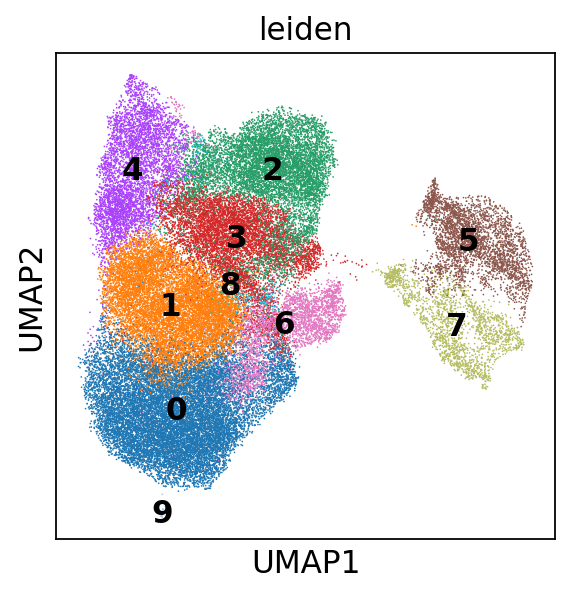

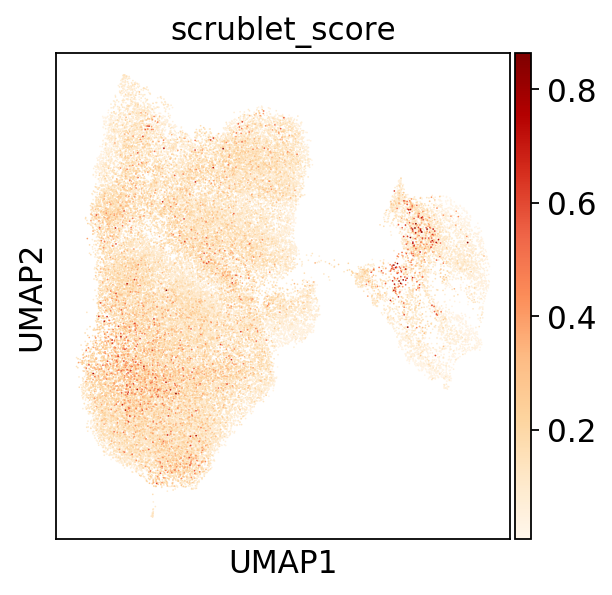

In [4]:
sc.pl.umap(adata, color=['leiden'], legend_loc='on data')
sc.pl.umap(adata, color=['scrublet_score'], legend_loc='on data', color_map='OrRd')

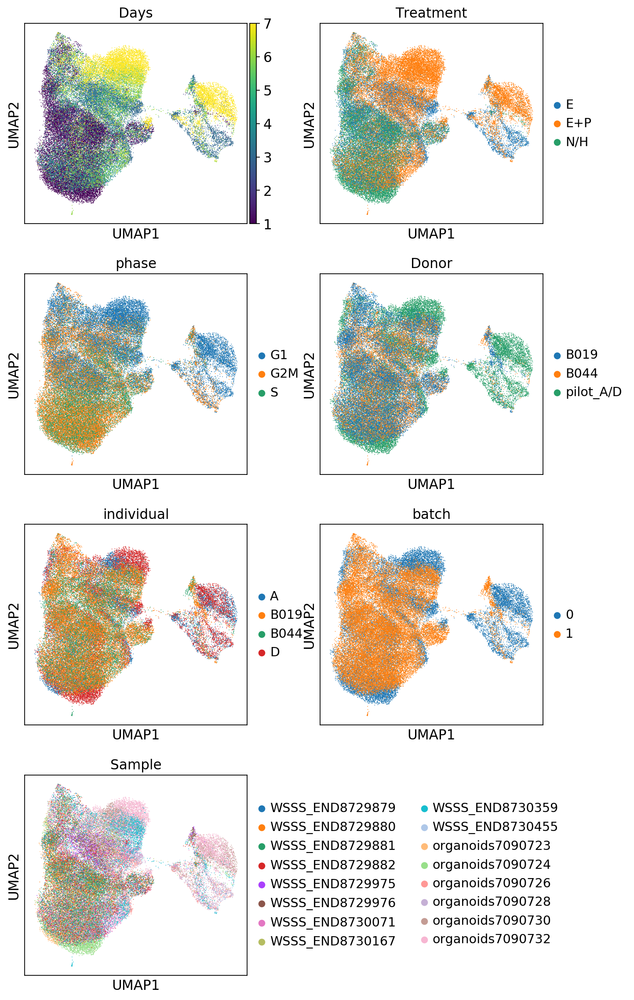

In [5]:
sc.pl.umap(adata, color=['Days', 'Treatment', 'phase',  'Donor', 'individual', 'batch', 'Sample'], save='_metadata.pdf', ncols = 2)

# Figures - paper

Define clusters:
- Cluster 1- Proliferative:  0 ,9  (light brown)
- Cluster 2- KRT5+LRG6+: 6 (dark brown)
- Cluster 3 - Proliferative mix: 1 ( light pink)
- Cluster 4- KRT5+KRT13+: 4 (Pink)
- Cluster 5- Secretory/Inter: 3,8 (light red)
- Cluster 6- Secretory: 2 (red)
- Cluster 7- Ciliated/Inter: 7 (light blue)
- Cluster 8- Ciliated (dark blue)



... storing 'clusters' as categorical
... storing 'clusters2' as categorical


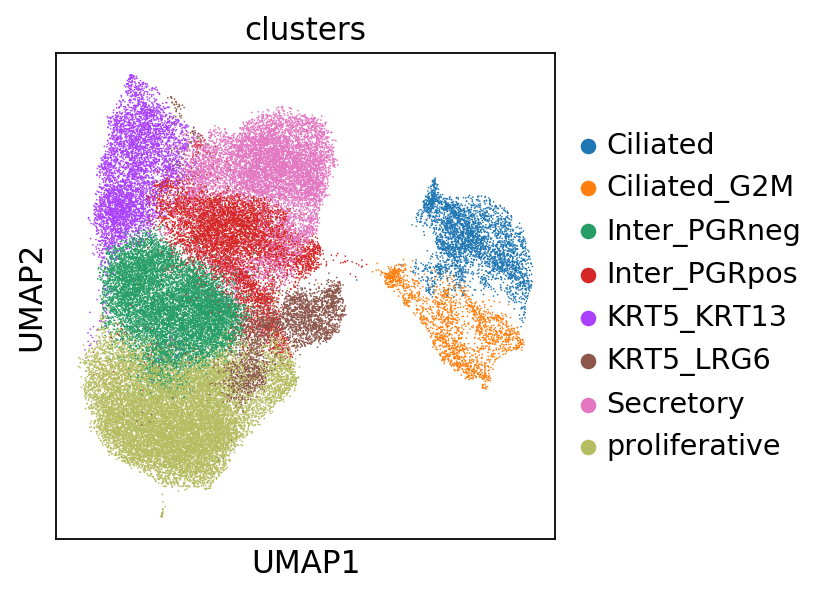

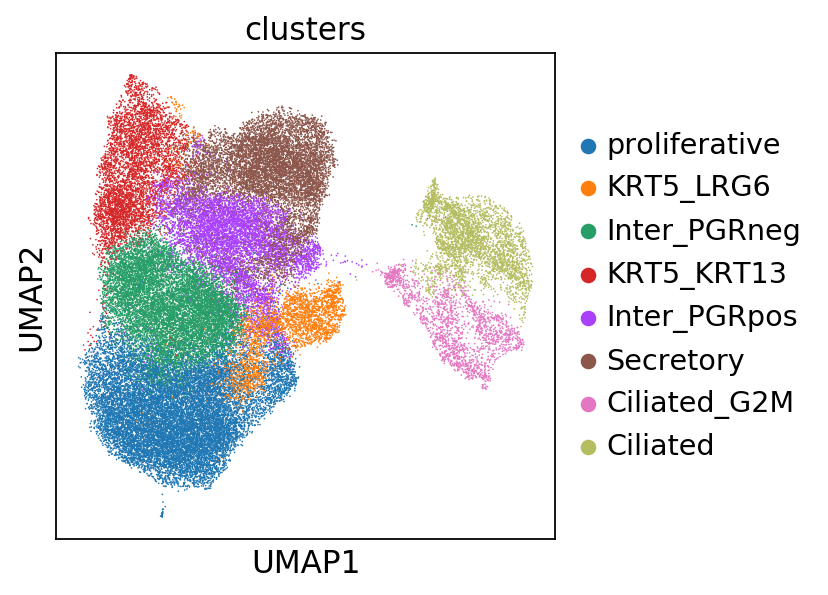

In [6]:
adata.obs['clusters'] = adata.obs['leiden'].tolist()
adata.obs.at[adata.obs['clusters'] == '0', 'clusters'] = 'proliferative'
adata.obs.at[adata.obs['clusters'] == '9', 'clusters'] = 'proliferative'
adata.obs.at[adata.obs['clusters'] == '6', 'clusters'] = 'KRT5_LRG6'

adata.obs.at[adata.obs['clusters'] == '1', 'clusters'] = 'Inter_PGRneg'
adata.obs.at[adata.obs['clusters'] == '4', 'clusters'] = 'KRT5_KRT13'

adata.obs.at[adata.obs['clusters'] == '3', 'clusters'] = 'Inter_PGRpos'
adata.obs.at[adata.obs['clusters'] == '8', 'clusters'] = 'Inter_PGRpos'
adata.obs.at[adata.obs['clusters'] == '2', 'clusters'] = 'Secretory'
adata.obs.at[adata.obs['clusters'] == '7', 'clusters'] = 'Ciliated_G2M'
adata.obs.at[adata.obs['clusters'] == '5', 'clusters'] = 'Ciliated'

adata.obs['clusters2'] = adata.obs['clusters']
sc.pl.umap(adata, color=['clusters'])
adata.obs['clusters'].cat.reorder_categories(['proliferative', 'KRT5_LRG6', 'Inter_PGRneg', 'KRT5_KRT13', 
                                              'Inter_PGRpos', 'Secretory', 
                                              'Ciliated_G2M', 'Ciliated'], inplace=True)
sc.pl.umap(adata, color=['clusters'],  save='_annotatedClusters.pdf')

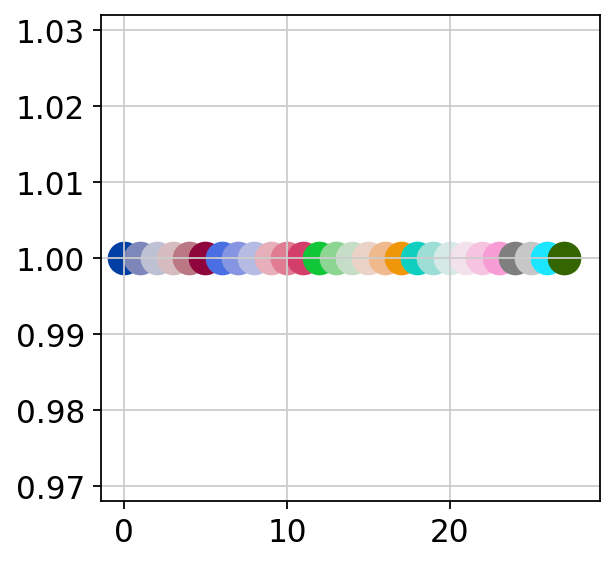

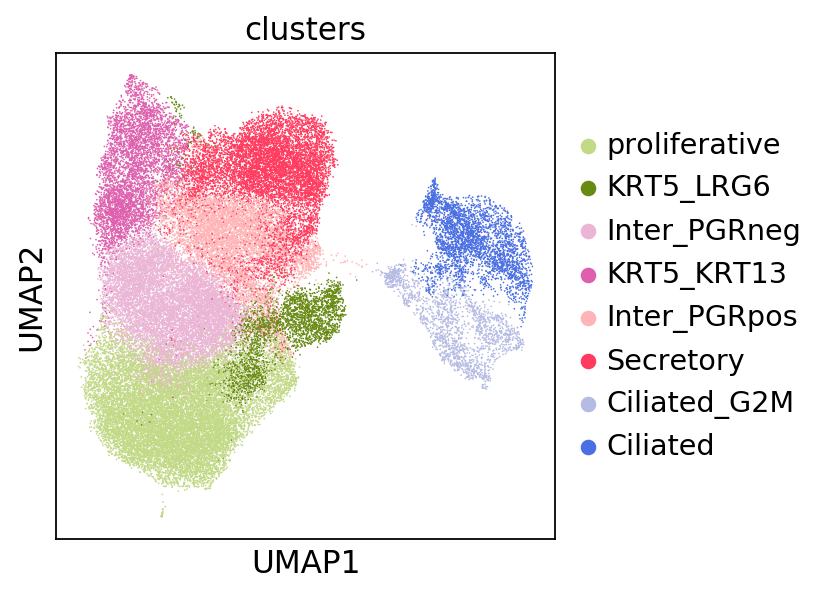

array(['#c2d986', '#688a12', '#ebb5d6', '#de5fad', '#ffb5b7', '#ff3b5f',
       '#b5bbe3', '#4a6fe3', '#f0b98d', '#e6afb9', '#e07b91', '#d33f6a',
       '#11c638', '#8dd593', '#c6dec7', '#ead3c6', '#f0b98d', '#ef9708',
       '#0fcfc0', '#9cded6', '#d5eae7', '#f3e1eb', '#f6c4e1', '#f79cd4',
       '#7f7f7f', '#c7c7c7', '#1CE6FF', '#336600'], dtype='<U7')

In [7]:
import matplotlib.pyplot as pl

for i in range(28):
    pl.scatter(i, 1, c=sc.pl.palettes.zeileis_26[i], s=200)
pl.show()
orig_colors = np.array(sc.pl.palettes.zeileis_26)
new_colors = orig_colors.copy()
new_colors[[0, 1, 2, 3, 4, 5, 6, 7, 8]] = orig_colors[[13, 27, 21, 23, 9, 11, 8, 6, 16]]  # mid / red
new_colors[[5]] = '#ff3b5f'
new_colors[[4]] = '#ffb5b7'
new_colors[[3]] = '#de5fad'
new_colors[[2]] = '#ebb5d6'
new_colors[[1]] = '#688a12'
new_colors[[0]] = '#c2d986'
adata.uns['clusters_colors'] = new_colors
sc.pl.umap(adata, color=['clusters'], save='_figure4_organoid.pdf')
new_colors

In [8]:
adata_count = anndata.AnnData(X=np.expm1(adata.raw.X), var=adata.raw.var, obs=adata.obs, asview=False)

## Save for cellXgene

In [9]:
sc.pp.normalize_per_cell(adata_count, counts_per_cell_after=1e4)
sc.pp.log1p(adata_count)
sc.pp.scale(adata_count, max_value=10)
adata_count.obsm['X_umap'] = adata.obsm['X_umap']
adata_count.uns['clusters_colors'] = adata.uns['clusters_colors']
adata_count.write('cellXgene/endometrium_organoid.h5ad')

## Save Seurat

In [10]:
adata_count = anndata.AnnData(X=np.expm1(adata.raw.X), var=adata.raw.var, obs=adata.obs, asview=False)
adata_count.obsm['X_umap'] = adata.obsm['X_umap']
adata_count.var['is_HVG'] = [i in adata.var_names for i in adata_count.var_names ]
adata_count.write('data/organoids-all-TC-keep-ccg_forSeurat.h5ad')
sc.pp.normalize_per_cell(adata_count, counts_per_cell_after=1e4, copy=True)
sc.pp.log1p(adata_count)
sc.pp.scale(adata_count)

## Write and plot metadata

In [11]:
stats = adata.obs.clusters.values.describe()
stats.to_csv(str(sc.settings.figdir)+'/clusterAnnotated_stats_organoids.csv')
adata.obs.to_csv(str(sc.settings.figdir)+'/barcode_metadata.csv')

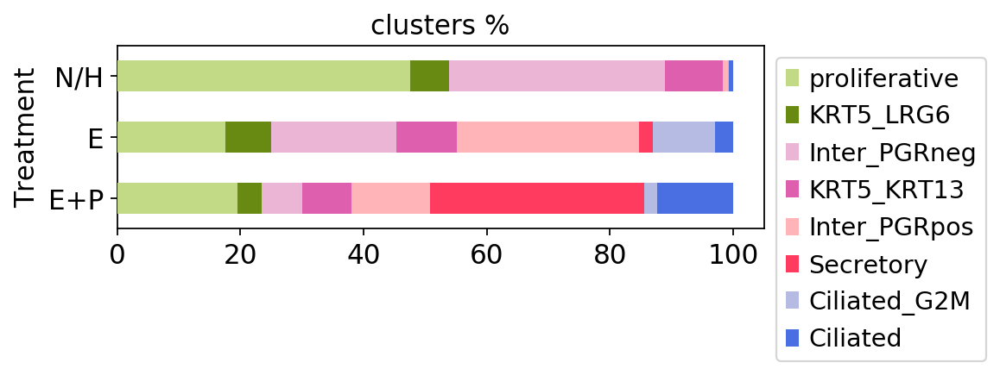

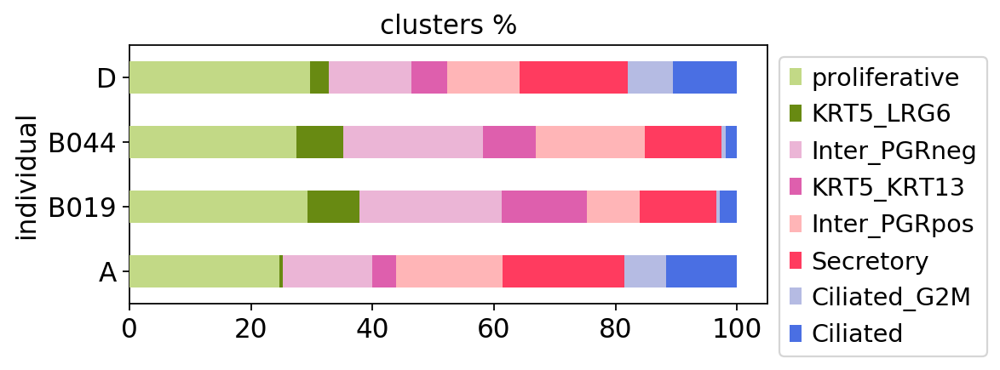

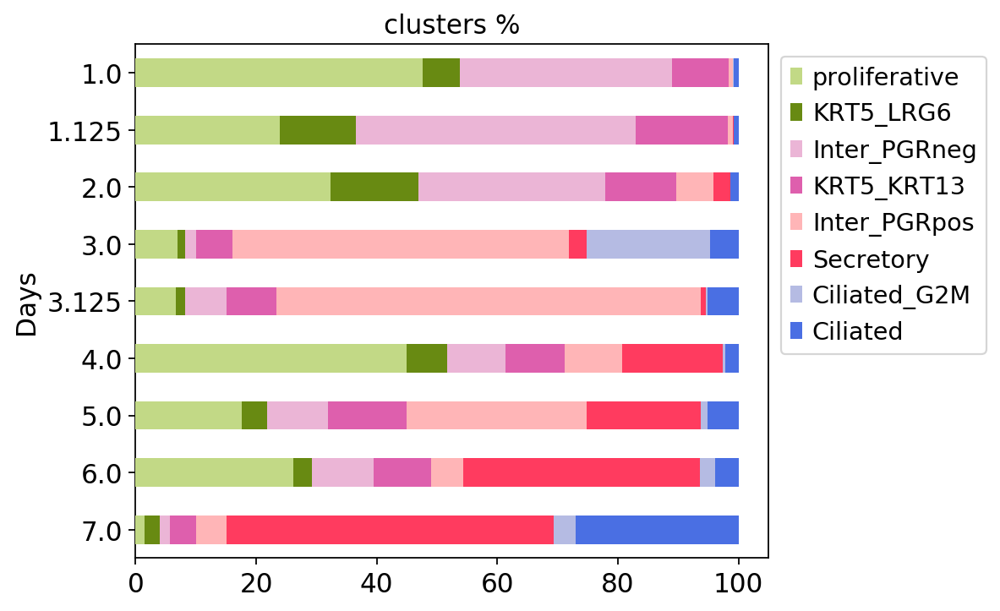

In [12]:
adata.obs['Treatment'].cat.reorder_categories(['E+P', 'E', 'N/H'], inplace=True)
Barplot('clusters', adata, 'Treatment', color = adata.uns['clusters_colors'], height = 1.75)
Barplot('clusters', adata,'individual', color = adata.uns['clusters_colors'], height = 2.5)
adata.obs['Days'] = adata.obs['Days'].astype('category')
adata.obs['Days'].cat.reorder_categories(adata.obs['Days'].cat.categories.sort_values(ascending=False), inplace=True)
Barplot('clusters', adata, 'Days', color = adata.uns['clusters_colors'], height = 5)

### Markers

In [13]:
# adata_count = anndata.AnnData(X=np.expm1(adata.raw.X), var=adata.raw.var, obs=adata.obs, asview=False)
# sc.pp.normalize_per_cell(adata_count, counts_per_cell_after=1e4)
# sc.pp.log1p(adata_count)
# sc.pp.scale(adata_count)

In [14]:
# markers = ['PGR', 'IHH', 'IGFBP4', 'GCLC', 'EMID1', 'CPM',
#                              'MKI67','HMGB2', "NOTCH3",
#                                   'LGR5','WNT7A', 'VTCN1', 'SLC26A7', 'CLDN22', 'PDPN', 'KRT5',
#                                  'LGR6', 'PNMT', 'TRH', 'PPP1R1B', 'ALDH1A1', 'WIF1',
#                                  'SEMA3B','FHL2', 'LIF', 'CCL2', 'ICAM1', 'CXCL2',
#                                  'MMP7', 'IFI6', 'RBP1', 'LYPD1', 'PAEP',
#                              'PTGS1', 'MT1G','ENPP3', 'SLC26A2',
#                                'C10orf10','NOTCH2', 'SCGB2A1', 'PDK4', 'ANG', 'C4BPA',
#                             'CXCL14','PAEP', 'RIMKLB', 'NUPR1','TFF3', 'MUC5B', 
#                             'LTF', 'BPIFB1', 'LHX1', 'PIFO', 'FOXJ1', 'TPPP3']
# markers = ['MMP7', 'PGR', 'IHH', 'ICAM1', 'FHL2', 'CD74', 'LYPD1', 'PAEP', 'SCGB2A1', 'TPPP3', 'PIFO']
# markers = ['LGR4', 'LGR5', 'LGR6', 'NGFR', 'TP63', 'TP73','KRT5', 'PDPN', 'SOX9', 'WNT7A', 'SOX2']
# sc.pl.dotplot(adata_count, markers, groupby='clusters', dendrogram=False, save='_figure5_organoids.pdf')
# sc.pl.stacked_violin(adata_count, markers, groupby='clusters', dendrogram=False, save='_figure5_organoids.pdf')

In [15]:
# sc.pl.stacked_violin(adata_count, markers, groupby='clusters', dendrogram=False, scale ="area")

# sc.pl.stacked_violin(adata_count, markers, groupby='clusters', dendrogram=False, scale ="width")

# sc.pl.stacked_violin(adata_count, markers, groupby='clusters', dendrogram=False, scale ="count")

In [16]:
# sc.pl.stacked_violin(adata_count, markers, groupby='clusters', dendrogram=False, scale ="count", standard_scale="var")
# sc.pl.stacked_violin(adata_count, markers, groupby='clusters', dendrogram=False, scale ="width", standard_scale="var")

# Plot Markers

In [17]:
adata_count = anndata.AnnData(X=np.expm1(adata.raw.X), var=adata.raw.var, obs=adata.obs, asview=False)
sc.pp.normalize_per_cell(adata_count, counts_per_cell_after=1e4)
sc.pp.log1p(adata_count)
sc.pp.scale(adata_count)

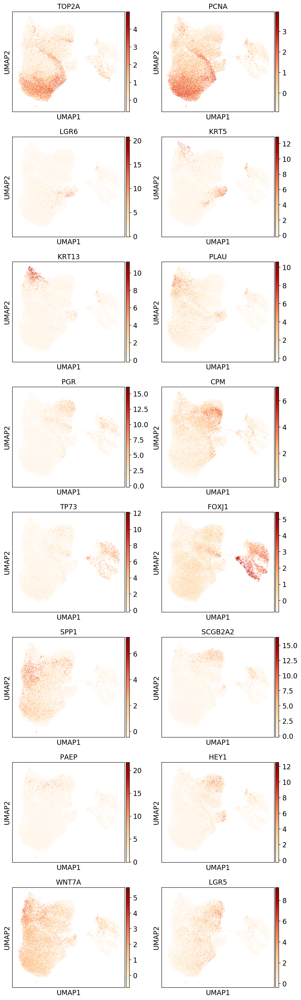

In [18]:
adata_count.obsm['X_umap'] = adata.obsm['X_umap']
markers = ['TOP2A', 'PCNA', 
           'LGR6', 'KRT5',
           'KRT13', 'PLAU', #'PLAUR', 
           'PGR', 'CPM',
           'TP73', 'FOXJ1',
           'SPP1', 'SCGB2A2', 
           'PAEP', 'HEY1',
           'WNT7A','LGR5'
#             'SOX9', 'MMP7', 
#             'PIFO', 'RSPH1',
#            'SERPINA1'
          ]
sc.pl.umap(adata_count, color=markers, save='-markers_figure4.pdf',color_map='OrRd', ncols=2)  

# Evaluate LGR6 and PAEP contributions

- What donors contribute to LGR6 in LGR6_cluster?
- What donors contribute to PAEP in Glandular?

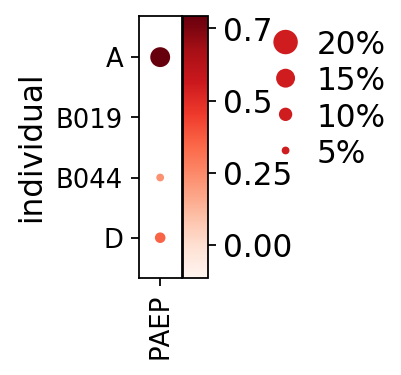

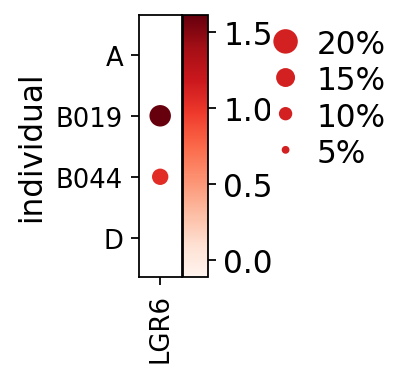

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[0.35, 0, 0.2, 0.5, 0.25])

In [19]:
sc.pl.dotplot(adata_count[[ i in 'Secretory' for i in adata_count.obs.clusters]], ['PAEP'], groupby='individual', dendrogram=False)
sc.pl.dotplot(adata_count[[ i in 'KRT5_LRG6' for i in adata_count.obs.clusters]], ['LGR6'], groupby='individual', dendrogram=False)

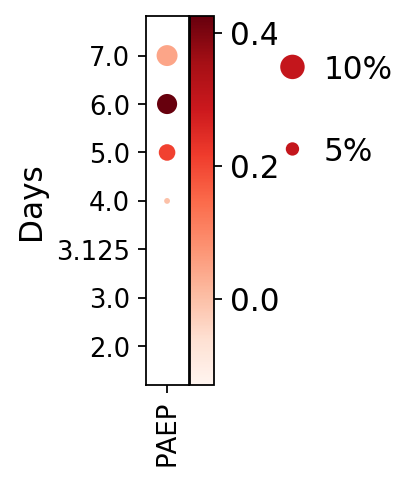

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[0.35, 0, 0.2, 0.5, 0.25])

In [20]:
adata_countB44 = adata_count[[ i in 'B044' for i in adata_count.obs.individual]]
sc.pl.dotplot(adata_countB44[[ i in 'Secretory' for i in adata_countB44.obs.clusters]], ['PAEP'], groupby='Days', dendrogram=False)

## Compare P treatment in KRT13 cluster
Expressio de PAEP en el cluster KRT13 se indueix per progesterona? → comparar presencia de PAEP en el cluster KRT13 abans i despres de la progesterona 


In [21]:
KRT13_adata = adata[[ i in 'KRT5_KRT13' for i in adata.obs.clusters]]
KRT13_adata.obs['Progesterone'] = 'yes'
KRT13_adata.obs.at[adata.obs['Treatment'] == 'E', 'Progesterone'] = 'no'

Trying to set attribute `.obs` of view, making a copy.


In [22]:
# marker calling
KRT13_adata_count = anndata.AnnData(X=np.expm1(KRT13_adata.raw.X), var=KRT13_adata.raw.var, obs=KRT13_adata.obs, asview=False)
sc.pp.filter_genes(KRT13_adata_count, min_cells= 3)
sc.pp.normalize_per_cell(KRT13_adata_count, counts_per_cell_after=1e4)
sc.pp.log1p(KRT13_adata_count)
sc.pp.scale(KRT13_adata_count)
sc.tl.rank_genes_groups(KRT13_adata_count, groupby='Progesterone', n_genes=50000, use_raw=False) #, method='logreg'

... storing 'Progesterone' as categorical
/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:223: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))


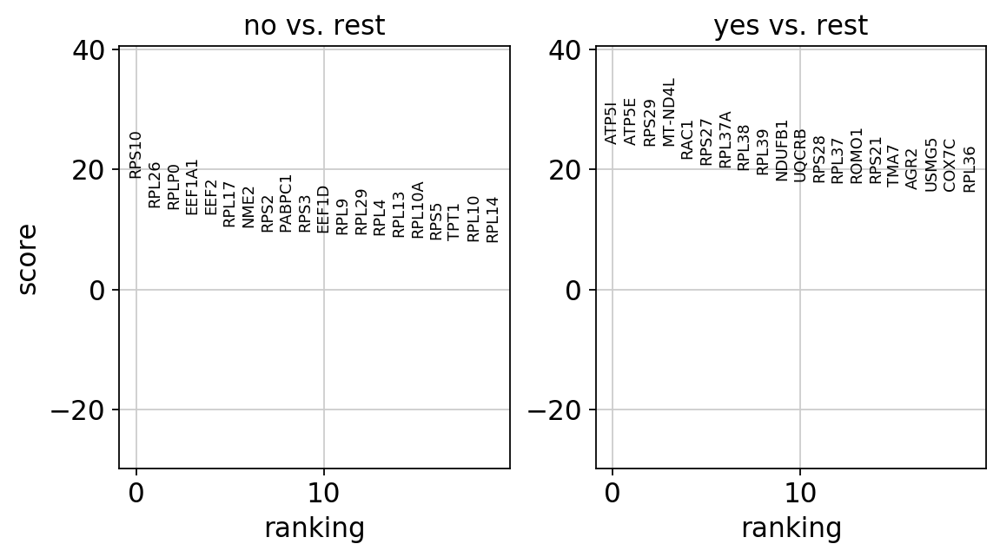

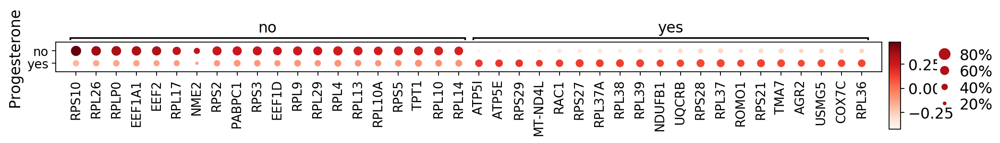

In [23]:
#marker visualisation
sc.pl.rank_genes_groups(KRT13_adata_count, n_genes=20, save='.pdf')
sc.pl.rank_genes_groups_dotplot(KRT13_adata_count, n_genes=20, dendrogram=False, save='.pdf')

result = KRT13_adata_count.uns['rank_genes_groups']

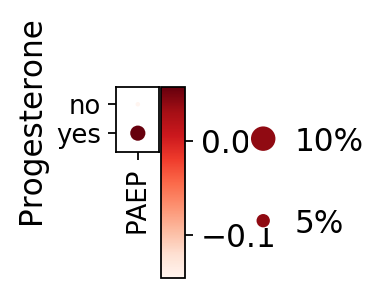

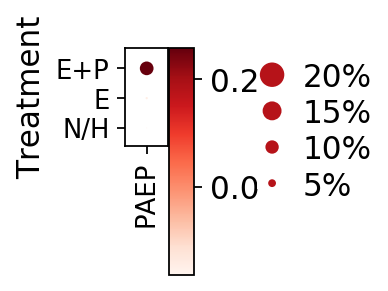

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[0.35, 0, 0.2, 0.5, 0.25])

In [24]:
sc.pl.dotplot(KRT13_adata_count, 'PAEP', groupby='Progesterone', dendrogram=False, save='_Progesterone.pdf')
sc.pl.dotplot(KRT13_adata_count, 'PAEP', groupby='Treatment', dendrogram=False, save='_ProgesteroneT.pdf')

In [25]:
KRT13_adata_count = anndata.AnnData(X=np.expm1(KRT13_adata.raw.X), var=KRT13_adata.raw.var, obs=KRT13_adata.obs, asview=False)
sc.pp.filter_genes(KRT13_adata_count, min_cells= 3)
sc.pp.normalize_per_cell(KRT13_adata_count, counts_per_cell_after=1e4)
# sc.pp.log1p(KRT13_adata_count)

for group in result['names'].dtype.names:
    print(group)
    adata_clus = KRT13_adata_count[ KRT13_adata_count.obs['Progesterone'] == group ]
    adata_rest = KRT13_adata_count[[not i for i in KRT13_adata_count.obs['Progesterone']==group]]
    mask = (result['pvals_adj'][group]<=1) & (result['scores'][group]>0)
    markdict = {'gene_'+key: result[key][group][mask] for key in ['names', 'pvals', 'pvals_adj', 'logfoldchanges']}
    adata_clus = adata_clus[:,markdict['gene_names']]
    adata_rest = adata_rest[:,markdict['gene_names']]
    markdict['mean_cluster'] = np.asarray(np.mean(adata_clus.X,axis=0)).reshape(-1)
    markdict['mean_rest'] = np.asarray(np.mean(adata_rest.X,axis=0)).reshape(-1)
    markdict['log2_FC'] = np.asarray(np.log2(markdict['mean_cluster']/markdict['mean_rest'])).reshape(-1)
    #are you expressed?
    adata_clus.X = adata_clus.X > 0
    adata_rest.X = adata_rest.X > 0
    markdict['percent_cluster'] = np.asarray(100*np.sum(adata_clus.X,axis=0)/adata_clus.shape[0]).reshape(-1)
    markdict['percent_rest'] = np.asarray(100*np.sum(adata_rest.X,axis=0)/adata_rest.shape[0]).reshape(-1)
    df = pd.DataFrame(markdict)
    df.rename(columns={'gene_names':'Gene',
                       'gene_logfoldchanges':'logFC',
                       'log2_FC':'log2_FC',
                       'gene_pvals':'P.Value',
                       'gene_pvals_adj':'adj.P.Val',
                       'mean_cluster':'mean_cluster',
                       'mean_rest':'mean_rest'},
              inplace=True)
    df.to_csv(str(sc.settings.figdir)+'/cluster_markers/KRT13_ProgTreatment_'+group+'_scanpy_DEGs.csv')

no


/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in true_divide
  app.launch_new_instance()
Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.


yes


/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in true_divide
  app.launch_new_instance()
Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.


# Finding marker genes


### All vs rest

#### scanpy

In [25]:
# marker calling
adata_count = anndata.AnnData(X=np.expm1(adata.raw.X), var=adata.raw.var, obs=adata.obs, asview=False)
sc.pp.normalize_per_cell(adata_count, counts_per_cell_after=1e4)
sc.pp.log1p(adata_count)
# sc.pp.scale(adata_count)
sc.tl.rank_genes_groups(adata_count, groupby='clusters', n_genes=50000, use_raw=False) #, method='logreg'

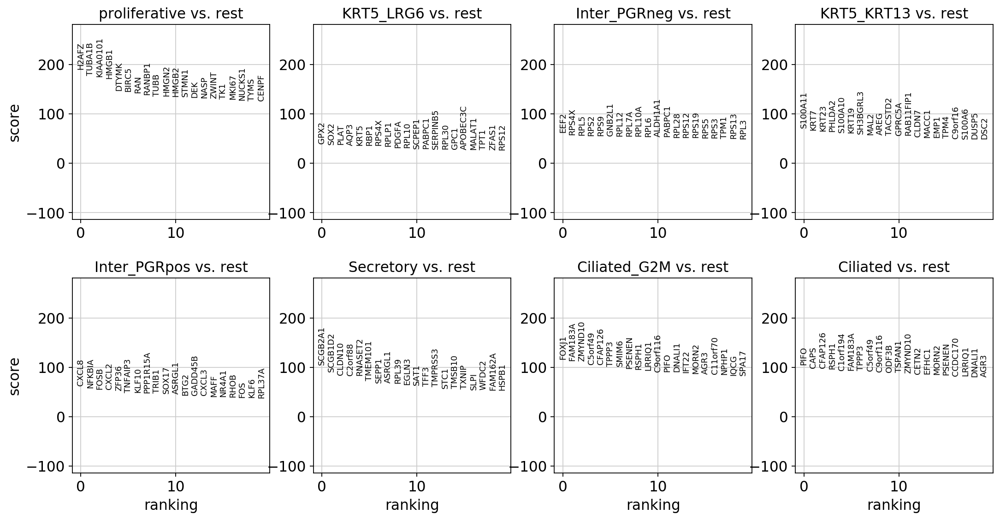

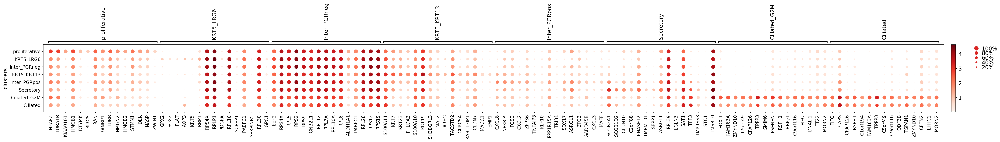

In [26]:
#marker visualisation
sc.pl.rank_genes_groups(adata_count, n_genes=20, save='.pdf')
sc.pl.rank_genes_groups_dotplot(adata_count, n_genes=15, dendrogram=False, save='.pdf')

In [27]:
result = adata_count.uns['rank_genes_groups']

os.system('mkdir -p '+str(sc.settings.figdir)+'/cluster_markers/')
os.system('rm '+str(sc.settings.figdir)+'/cluster_markers/*scanpy*.csv')

for group in result['names'].dtype.names:
    print(group)
    adata_clus = adata_count[adata.obs['clusters'] == group]
    adata_rest = adata_count[[not i for i in adata.obs['clusters']==group]]
    mask = (result['pvals_adj'][group]<=1) & (result['scores'][group]>0)
    markdict = {'gene_'+key: result[key][group][mask] for key in ['names', 'pvals', 'pvals_adj', 'logfoldchanges']}
    adata_clus = adata_clus[:,markdict['gene_names']]
    adata_rest = adata_rest[:,markdict['gene_names']]
    markdict['mean_cluster'] = np.asarray(np.mean(adata_clus.X,axis=0)).reshape(-1)
    markdict['mean_rest'] = np.asarray(np.mean(adata_rest.X,axis=0)).reshape(-1)
    markdict['log2_FC'] = np.asarray(np.log2(markdict['mean_cluster']/markdict['mean_rest'])).reshape(-1)
    #are you expressed?
    adata_clus.X = adata_clus.X > 0
    adata_rest.X = adata_rest.X > 0
    markdict['percent_cluster'] = np.asarray(100*np.sum(adata_clus.X,axis=0)/adata_clus.shape[0]).reshape(-1)
    markdict['percent_rest'] = np.asarray(100*np.sum(adata_rest.X,axis=0)/adata_rest.shape[0]).reshape(-1)
    df = pd.DataFrame(markdict)
    df.rename(columns={'gene_names':'Gene',
                       'gene_logfoldchanges':'logFC',
                       'log2_FC':'log2_FC',
                       'gene_pvals':'P.Value',
                       'gene_pvals_adj':'adj.P.Val',
                       'mean_cluster':'mean_cluster',
                       'mean_rest':'mean_rest'},
              inplace=True)
    df.to_csv(str(sc.settings.figdir)+'/cluster_markers/'+group+'_scanpy_DEGs.csv')

proliferative


/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in true_divide
  app.launch_new_instance()
Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.


KRT5_LRG6


/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in true_divide
  app.launch_new_instance()
Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.


Inter_PGRneg


/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in true_divide
  app.launch_new_instance()
Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.


KRT5_KRT13


/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in true_divide
  app.launch_new_instance()
Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.


Inter_PGRpos


Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.


Secretory


/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in true_divide
  app.launch_new_instance()
Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.


Ciliated_G2M


/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in true_divide
  app.launch_new_instance()
Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.


Ciliated


/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in true_divide
  app.launch_new_instance()
Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.


### All vs rest

TF-IDF

In [28]:
adata_bin = anndata.AnnData(X=np.expm1(adata.raw.X), var=adata.raw.var, obs=adata.obs, asview=False)

import episcanpy as epi
epi.pp.binarize(adata_bin, copy=False)
adata_bin.X.shape


/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/scanpy/api/__init__.py:6: FutureWarning: 

In a future version of Scanpy, `scanpy.api` will be removed.
Simply use `import scanpy as sc` and `import scanpy.external as sce` instead.

  FutureWarning


(53720, 24241)

In [29]:
from sklearn.feature_extraction.text import TfidfTransformer
transformer = TfidfTransformer()
transformer

tfidf = transformer.fit_transform(adata_bin.X.T)
adata_bin.X = tfidf.T
adata_bin.X.shape

(53720, 24241)

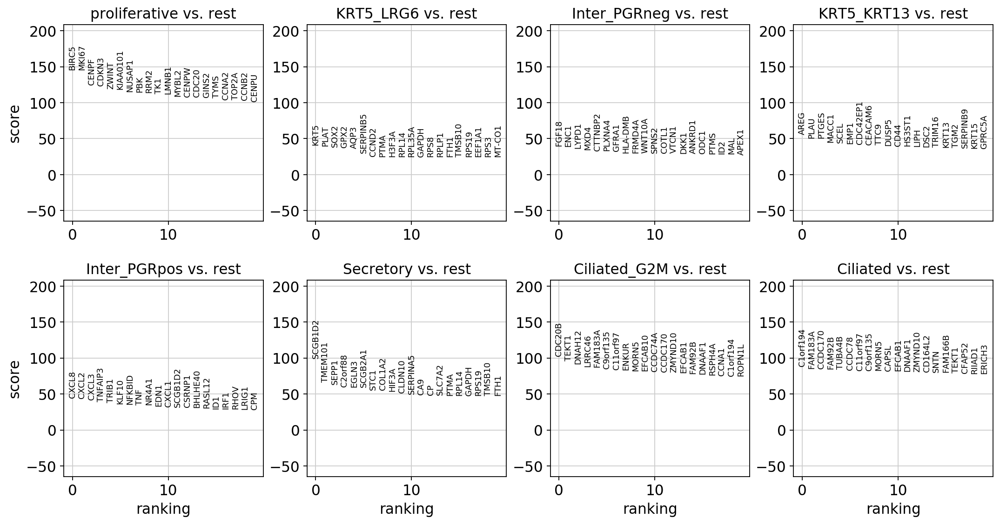

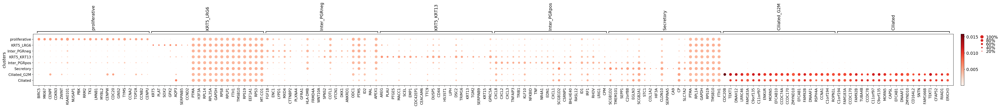

In [30]:
sc.tl.rank_genes_groups(adata_bin, groupby='clusters', n_genes=50000, use_raw=False) #, method='logreg'
sc.pl.rank_genes_groups(adata_bin, n_genes=20, save='_tfidf.pdf')
sc.pl.rank_genes_groups_dotplot(adata_bin, n_genes=20, dendrogram=False, save='_tfidf_DEscanpy.pdf')

In [31]:
adata_count = anndata.AnnData(X=np.expm1(adata.raw.X), var=adata.raw.var, obs=adata.obs, asview=False)
sc.pp.normalize_per_cell(adata_count, counts_per_cell_after=1e4)
sc.pp.log1p(adata_count)
sc.pp.scale(adata_count, max_value=10)
adata_count.uns['rank_genes_groups'] = adata_bin.uns['rank_genes_groups']

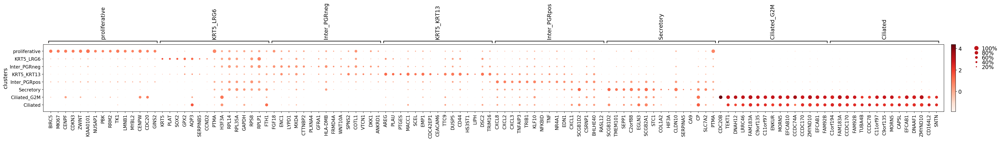

In [32]:
sc.pl.rank_genes_groups_dotplot(adata_count, n_genes=15, dendrogram=False, save='_tfidf_DEscanpy.pdf')

#### DE with limma

Prepare object to run limma

In [33]:
adata_count = anndata.AnnData(X=adata.raw.X, var=adata.raw.var, obs=adata.obs)
sc.pp.filter_genes(adata_count, min_cells = 5)
sc.pp.filter_cells(adata_count, min_genes = 200)
sc.pp.normalize_per_cell(adata_count, counts_per_cell_after=1e4)
sc.pp.log1p(adata_count)
print(adata_count.obs['clusters'].values.describe())
adata_count.X.shape

               counts     freqs
categories                     
proliferative   15114  0.281348
KRT5_LRG6        2948  0.054877
Inter_PGRneg    10377  0.193168
KRT5_KRT13       4778  0.088943
Inter_PGRpos     7076  0.131720
Secretory        8217  0.152960
Ciliated_G2M     1888  0.035145
Ciliated         3322  0.061839


(53720, 24241)

Downsample clusters with > n cells - take n cells

In [34]:
import random
from itertools import chain

# Find clusters with > n cells
n = 5000
cluster_counts = adata_count.obs['clusters'].values.describe()
cl2downsample = cluster_counts.index[ cluster_counts['counts'] > n ]

# save all barcode ids from small clusters
holder = []
holder.append( adata_count.obs_names[[ i not in cl2downsample for i in adata_count.obs['clusters'] ]] ) 

# randomly sample n cells in the cl2downsample
for cl in cl2downsample:
    print(cl)
    cl_sample = adata_count[[ i == cl for i in adata_count.obs['clusters'] ]].obs_names
    # n = int(round(len(cl_sample)/2, 0))
    cl_downsample = random.sample(set(cl_sample), n )
    holder.append(cl_downsample)
    
# samples to include
samples = list(chain(*holder))

# Filter adata_count
adata_count = adata_count[[ i in samples for i in adata_count.obs_names ]]
adata_count.X.shape

proliferative
Inter_PGRneg
Inter_PGRpos
Secretory


(32936, 24241)

In [35]:
print(adata_count.obs['clusters'].values.describe())

               counts     freqs
categories                     
proliferative    5000  0.151810
KRT5_LRG6        2948  0.089507
Inter_PGRneg     5000  0.151810
KRT5_KRT13       4778  0.145069
Inter_PGRpos     5000  0.151810
Secretory        5000  0.151810
Ciliated_G2M     1888  0.057323
Ciliated         3322  0.100862


In [36]:
t = adata_count.X.toarray().T
df = pd.DataFrame(data=t, columns= adata_count.obs.index, index=adata_count.var_names)

In [37]:
meta_df = pd.DataFrame(data={'Cell':list(adata.obs.index),
                             'cell_type':[ str(i) for i in adata.obs['clusters']],
                             'sample':[ str(i) for i in adata.obs['Donor']],
                             'covariate':[ i for i in adata.obs['individual']]})
meta_df.head()

,Cell,cell_type,sample,covariate
0,organoids7090723-AAACCTGCAGGCTCAC,proliferative,pilot_A/D,A
1,organoids7090723-AAACCTGCATCAGTAC,proliferative,pilot_A/D,A
2,organoids7090723-AAACCTGTCCACGTTC,proliferative,pilot_A/D,A
3,organoids7090723-AAACCTGTCCTATTCA,proliferative,pilot_A/D,A
4,organoids7090723-AAACGGGAGATGTAAC,proliferative,pilot_A/D,A


In [38]:
outpath = str(sc.settings.figdir)+'/cluster_markers/'

In [39]:
%load_ext rpy2.ipython

In [40]:
%%R -i df -i meta_df -i outpath

library(limma)
library(edgeR)
options(expressions = 5e5)

# Format
ex_mat=as.matrix(df)
rownames(meta_df) = meta_df$Cell


# Shared cells
rownames(meta_df) = gsub('-', '.', rownames(meta_df))
shared_cells = intersect(rownames(meta_df), colnames(ex_mat))
print(rownames(meta_df)[1:3])
print(colnames(ex_mat)[1:3])
message(length(shared_cells), ' shared cells')
ex_mat = ex_mat[, shared_cells]
meta_df = meta_df[shared_cells,]

# Filter low expressed genes
keep = aveLogCPM(ex_mat) > 0
ex_mat = ex_mat[ keep, ]

# Extract celltypes
cells = rownames(meta_df)
celltypes = unique(meta_df$cell_type)
covariates = meta_df$covariate


# For each cluster, make cluster vs rest comparison
for (celltype in celltypes){
    message(celltype)
    
    # Extract cells in cluster and rest
    cells_cluster = rownames(subset(meta_df, cell_type == celltype))
    cells_rest = rownames(subset(meta_df, cell_type != celltype))
    
    # build cluster_type vector
    cluster_type = rep(0, length(cells))
    names(cluster_type) = cells
    cluster_type[ cells_cluster ] = 'cluster'
    cluster_type[ cells_rest ] = 'rest'
    
    design.matrix <- model.matrix(~ 0 + cluster_type + covariates)
    
    # Now tell limma how do you want to compare (i.e. cluster vs rest rest)
    contrast.matrix <- makeContrasts(clVSrest = cluster_typecluster - cluster_typerest, levels = design.matrix)

    # Make model and run contrasts
    fit <- lmFit(ex_mat, design.matrix)
    fit <- contrasts.fit(fit, contrast.matrix)
    fit <- eBayes(fit)
    
    # Make a dataframe containing the important data
    results = topTable(fit, adjust="fdr", number = nrow(ex_mat), coef = 'clVSrest')
    
    # Add and filter needed data
    results$Gene = rownames(results)
    results = results[ , c('Gene', 'logFC', 'P.Value', 'adj.P.Val')]
    results$AveExpr_cluster = apply(ex_mat[ results$Gene, cells_cluster], 1, mean)
    results$AveExpr_rest = apply(ex_mat[ results$Gene, cells_rest], 1, mean)
    results$percentExpr_cluster = apply(ex_mat[ results$Gene, cells_cluster], 1, function(x) sum(c(x > 0)+0) ) / length(cells_cluster)
    results$percentExpr_rest = apply(ex_mat[ results$Gene, cells_rest], 1, function(x) sum(c(x > 0)+0) ) / length(cells_rest)
    
    results$AveExpr_cluster = round(results$AveExpr_cluster, 6)
    results$AveExpr_rest = round(results$AveExpr_rest, 6)
    results$percentExpr_cluster = round(results$percentExpr_cluster, 6)
    results$percentExpr_rest = round(results$percentExpr_rest, 6)
    # and store it as csv file
    write.csv(results, file = paste0(outpath, celltype, '_DEGs.csv'), row.names = F, col.names = T, quote = F)
    
}

[1] "organoids7090723.AAACCTGCAGGCTCAC" "organoids7090723.AAACCTGCATCAGTAC"
[3] "organoids7090723.AAACCTGTCCACGTTC"
[1] "organoids7090723.AAACCTGCAGGCTCAC" "organoids7090723.AAACCTGTCCTATTCA"
[3] "organoids7090723.AAACGGGAGATGTAAC"


R[write to console]: 32936 shared cells

R[write to console]: proliferative

R[write to console]: KRT5_KRT13

R[write to console]: Inter_PGRneg

R[write to console]: Inter_PGRpos

R[write to console]: KRT5_LRG6

R[write to console]: Ciliated_G2M

R[write to console]: Secretory

R[write to console]: Ciliated



# Compare donors


### All vs rest

#### scanpy

In [26]:
# marker calling
adata_count = anndata.AnnData(X=np.expm1(adata.raw.X), var=adata.raw.var, obs=adata.obs, asview=False)
sc.pp.normalize_per_cell(adata_count, counts_per_cell_after=1e4)
sc.pp.log1p(adata_count)
# sc.pp.scale(adata_count)
sc.tl.rank_genes_groups(adata_count, groupby='Donor', n_genes=50000, use_raw=False) #, method='logreg'

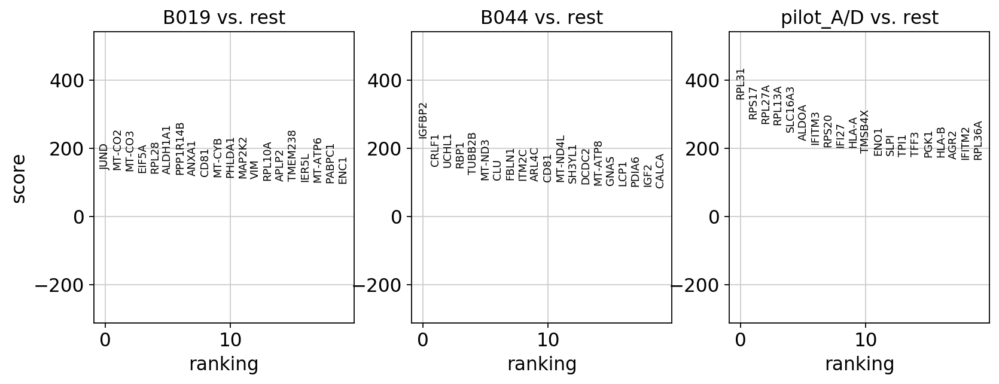

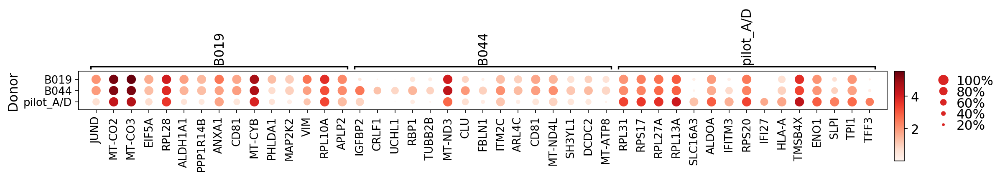

In [27]:
#marker visualisation
sc.pl.rank_genes_groups(adata_count, n_genes=20, save='_Donor.pdf')
sc.pl.rank_genes_groups_dotplot(adata_count, n_genes=15, dendrogram=False, save='_Donor.pdf')

In [30]:
result = adata_count.uns['rank_genes_groups']

os.system('mkdir -p '+str(sc.settings.figdir)+'/donor_markers/')

for group in result['names'].dtype.names:
    print(group)
    adata_clus = adata_count[adata.obs['Donor'] == group]
    adata_rest = adata_count[[not i for i in adata.obs['Donor']==group]]
    mask = (result['pvals_adj'][group]<=1) & (result['scores'][group]>0)
    markdict = {'gene_'+key: result[key][group][mask] for key in ['names', 'pvals', 'pvals_adj', 'logfoldchanges']}
    adata_clus = adata_clus[:,markdict['gene_names']]
    adata_rest = adata_rest[:,markdict['gene_names']]
    markdict['mean_cluster'] = np.asarray(np.mean(adata_clus.X,axis=0)).reshape(-1)
    markdict['mean_rest'] = np.asarray(np.mean(adata_rest.X,axis=0)).reshape(-1)
    markdict['log2_FC'] = np.asarray(np.log2(markdict['mean_cluster']/markdict['mean_rest'])).reshape(-1)
    #are you expressed?
    adata_clus.X = adata_clus.X > 0
    adata_rest.X = adata_rest.X > 0
    markdict['percent_cluster'] = np.asarray(100*np.sum(adata_clus.X,axis=0)/adata_clus.shape[0]).reshape(-1)
    markdict['percent_rest'] = np.asarray(100*np.sum(adata_rest.X,axis=0)/adata_rest.shape[0]).reshape(-1)
    df = pd.DataFrame(markdict)
    df.rename(columns={'gene_names':'Gene',
                       'gene_logfoldchanges':'logFC',
                       'log2_FC':'log2_FC',
                       'gene_pvals':'P.Value',
                       'gene_pvals_adj':'adj.P.Val',
                       'mean_cluster':'mean_cluster',
                       'mean_rest':'mean_rest'},
              inplace=True)
    group = group.replace("/", "")
    df.to_csv(str(sc.settings.figdir)+'/donor_markers/'+group+'_scanpy_DEGs.csv')

B019


/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in true_divide
  from ipykernel import kernelapp as app
Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.


B044


/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in true_divide
  from ipykernel import kernelapp as app
Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.


pilot_A/D


/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in true_divide
  from ipykernel import kernelapp as app
Trying to set attribute `.X` of view, making a copy.
Trying to set attribute `.X` of view, making a copy.


### All vs rest

TF-IDF

In [45]:
adata_bin = anndata.AnnData(X=np.expm1(adata.raw.X), var=adata.raw.var, obs=adata.obs, asview=False)

import episcanpy as epi
epi.pp.binarize(adata_bin, copy=False)
adata_bin.X.shape


(53720, 24241)

In [46]:
from sklearn.feature_extraction.text import TfidfTransformer
transformer = TfidfTransformer()
transformer

tfidf = transformer.fit_transform(adata_bin.X.T)
adata_bin.X = tfidf.T
adata_bin.X.shape

(53720, 24241)

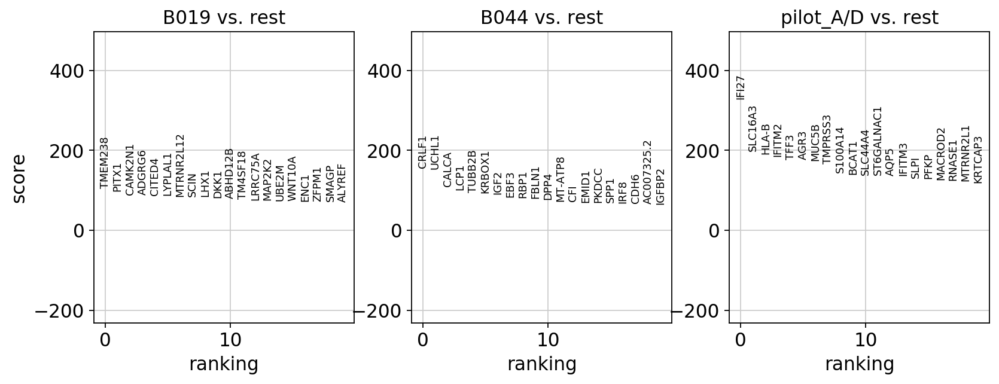

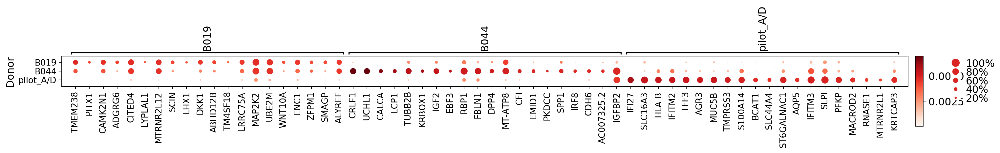

In [47]:
sc.tl.rank_genes_groups(adata_bin, groupby='Donor', n_genes=50000, use_raw=False) #, method='logreg'
sc.pl.rank_genes_groups(adata_bin, n_genes=20, save='_tfidf_Donor.pdf')
sc.pl.rank_genes_groups_dotplot(adata_bin, n_genes=20, dendrogram=False, save='_tfidf_DEscanpy_Donor.pdf')

In [48]:
adata_count = anndata.AnnData(X=np.expm1(adata.raw.X), var=adata.raw.var, obs=adata.obs, asview=False)
sc.pp.normalize_per_cell(adata_count, counts_per_cell_after=1e4)
sc.pp.log1p(adata_count)
sc.pp.scale(adata_count, max_value=10)
adata_count.uns['rank_genes_groups'] = adata_bin.uns['rank_genes_groups']

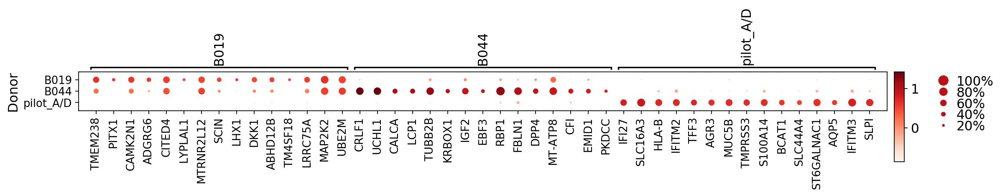

In [49]:
sc.pl.rank_genes_groups_dotplot(adata_count, n_genes=15, dendrogram=False, save='_tfidf_DEscanpy_Donor.pdf')

#### DE with limma

Prepare object to run limma

In [50]:
adata_count = anndata.AnnData(X=adata.raw.X, var=adata.raw.var, obs=adata.obs)
sc.pp.filter_genes(adata_count, min_cells = 5)
sc.pp.filter_cells(adata_count, min_genes = 200)
sc.pp.normalize_per_cell(adata_count, counts_per_cell_after=1e4)
sc.pp.log1p(adata_count)
print(adata_count.obs['Donor'].values.describe())
adata_count.X.shape

            counts     freqs
categories                  
B019         18830  0.350521
B044         11470  0.213515
pilot_A/D    23420  0.435964


(53720, 24241)

In [51]:
t = adata_count.X.toarray().T
df = pd.DataFrame(data=t, columns= adata_count.obs.index, index=adata_count.var_names)

In [52]:
meta_df = pd.DataFrame(data={'Cell':list(adata.obs.index),
                             'cell_type':[ str(i) for i in adata.obs['Donor']]})
meta_df.head()

,Cell,cell_type
0,organoids7090723-AAACCTGCAGGCTCAC,pilot_A/D
1,organoids7090723-AAACCTGCATCAGTAC,pilot_A/D
2,organoids7090723-AAACCTGTCCACGTTC,pilot_A/D
3,organoids7090723-AAACCTGTCCTATTCA,pilot_A/D
4,organoids7090723-AAACGGGAGATGTAAC,pilot_A/D


In [53]:
outpath = str(sc.settings.figdir)+'/donor_markers/'

In [54]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [ ]:
%%R -i df -i meta_df -i outpath

library(limma)
library(edgeR)
options(expressions = 5e5)

# Format
ex_mat=as.matrix(df)
rownames(meta_df) = meta_df$Cell


# Shared cells
rownames(meta_df) = gsub('-', '.', rownames(meta_df))
shared_cells = intersect(rownames(meta_df), colnames(ex_mat))
print(rownames(meta_df)[1:3])
print(colnames(ex_mat)[1:3])
message(length(shared_cells), ' shared cells')
ex_mat = ex_mat[, shared_cells]
meta_df = meta_df[shared_cells,]

# Filter low expressed genes
keep = aveLogCPM(ex_mat) > 0
ex_mat = ex_mat[ keep, ]

# Extract celltypes
cells = rownames(meta_df)
celltypes = unique(meta_df$cell_type)
# covariates = meta_df$covariate


# For each cluster, make cluster vs rest comparison
for (celltype in celltypes){
    message(celltype)
    
    # Extract cells in cluster and rest
    cells_cluster = rownames(subset(meta_df, cell_type == celltype))
    cells_rest = rownames(subset(meta_df, cell_type != celltype))
    
    # build cluster_type vector
    cluster_type = rep(0, length(cells))
    names(cluster_type) = cells
    cluster_type[ cells_cluster ] = 'cluster'
    cluster_type[ cells_rest ] = 'rest'
    
#     design.matrix <- model.matrix(~ 0 + cluster_type + covariates)
    design.matrix <- model.matrix(~ 0 + cluster_type)
    
    # Now tell limma how do you want to compare (i.e. cluster vs rest rest)
    contrast.matrix <- makeContrasts(clVSrest = cluster_typecluster - cluster_typerest, levels = design.matrix)

    # Make model and run contrasts
    fit <- lmFit(ex_mat, design.matrix)
    fit <- contrasts.fit(fit, contrast.matrix)
    fit <- eBayes(fit)
    
    # Make a dataframe containing the important data
    results = topTable(fit, adjust="fdr", number = nrow(ex_mat), coef = 'clVSrest')
    
    # Add and filter needed data
    results$Gene = rownames(results)
    results = results[ , c('Gene', 'logFC', 'P.Value', 'adj.P.Val')]
    results$AveExpr_cluster = apply(ex_mat[ results$Gene, cells_cluster], 1, mean)
    results$AveExpr_rest = apply(ex_mat[ results$Gene, cells_rest], 1, mean)
    results$percentExpr_cluster = apply(ex_mat[ results$Gene, cells_cluster], 1, function(x) sum(c(x > 0)+0) ) / length(cells_cluster)
    results$percentExpr_rest = apply(ex_mat[ results$Gene, cells_rest], 1, function(x) sum(c(x > 0)+0) ) / length(cells_rest)
    
    results$AveExpr_cluster = round(results$AveExpr_cluster, 6)
    results$AveExpr_rest = round(results$AveExpr_rest, 6)
    results$percentExpr_cluster = round(results$percentExpr_cluster, 6)
    results$percentExpr_rest = round(results$percentExpr_rest, 6)
    # and store it as csv file
    celltype = gsub('/', '', celltype)
    write.csv(results, file = paste0(outpath, celltype, '_DEGs.csv'), row.names = F, col.names = T, quote = F)
    
}

R[write to console]: Error: protect(): protection stack overflow

R[write to console]: In addition: 
R[write to console]: There were 16 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: Execution halted

